# Laboratory #5_1 : Object Detection with YOLO

At the end of this laboratory, you would get familiarized with

*   Object Detection
*   YOLO for Object Detection using Keras and TensorFlow

**Remember this is a graded exercise.**

*   For every plot, make sure you provide appropriate titles, axis labels, legends, wherever applicable.
*   Create reusable functions where ever possible, so that the code could be reused at different places.
*   Add sufficient comments and explanations wherever necessary.
*   **Once you have the code completed, use GPU to train model faster.**

---

# YOLOv3 for Object Detection

*   There are several open source implementations of each version of YOLO.
*   For this exercise, we would not be implementing the YOLO from scratch as it is a challenging model and requires many customized elements.
*   We would use an open source implementation of YOLOv3 available from Python Lessons github repo, implemented with TensorFlow 2.x.
*   More details about YOLO can be found [here](https://pjreddie.com/darknet/yolo/). Refer the site and also the [paper](https://pjreddie.com/media/files/papers/YOLOv3.pdf) for better understanding.

## Clone the repo in the notebook

In [1]:
! git clone --recursive https://github.com/pythonlessons/TensorFlow-2.x-YOLOv3.git

Cloning into 'TensorFlow-2.x-YOLOv3'...
remote: Enumerating objects: 800, done.
remote: Counting objects: 100% (29/29), done.
remote: Compressing objects: 100% (29/29), done.
remote: Total 800 (delta 15), reused 2 (delta 0), pack-reused 771
Receiving objects: 100% (800/800), 70.79 MiB | 29.43 MiB/s, done.
Resolving deltas: 100% (467/467), done.


In [2]:
# navigate to the cloned repository

%cd TensorFlow-2.x-YOLOv3/

/content/TensorFlow-2.x-YOLOv3


In [3]:
# installing additional requirements using pip

! pip install -r requirements.txt

# Please note that some libraries would return error. 
# If they are not important dependecies, you can skip those errors.
# Pip installation might require restarting the notebook. 
# Follow the installation output

## Loading pre-trained weights

*   Load the weights using any one of the methods

In [3]:
#  download the weights to the filesystem 
# (Remember that this would not be persistent)
# If you need the weights to be persistent, upload the weights to your drive
# and load from the drive

! wget -P model_data https://pjreddie.com/media/files/yolov3.weights

--2021-12-20 20:54:45--  https://pjreddie.com/media/files/yolov3.weights
Resolving pjreddie.com (pjreddie.com)... 128.208.4.108
Connecting to pjreddie.com (pjreddie.com)|128.208.4.108|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 248007048 (237M) [application/octet-stream]
Saving to: ‘model_data/yolov3.weights’

yolov3.weights      100%[===================>] 236.52M  52.9MB/s    in 4.8s    

2021-12-20 20:54:50 (49.5 MB/s) - ‘model_data/yolov3.weights’ saved [248007048/248007048]



## Detecting objects in images

*   Run sample predictions using the pre-trained weights

In [4]:
from yolov3.utils import detect_image, Load_Yolo_model
from yolov3.configs import *

image_path = "./IMAGES/kite.jpg"
output_path = "./kite_pred.jpg"

yolo = Load_Yolo_model()

kite_predictions = detect_image(
    yolo, 
    image_path, 
    output_path, 
    input_size=YOLO_INPUT_SIZE, 
    show=False, 
    rectangle_colors=(255,0,0))
print(YOLO_INPUT_SIZE)
# You will find the predictions file saved in the output path
# all objects present in MS-COCO classes would be detected in the saved file

GPUs [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]
Loading Darknet_weights from: model_data/yolov3.weights
416


## Understanding Image Detection function

*   In this exercise, you have to write your own function for object detection (Each step would lead to replicating the existing function)

*   Load the input image and visualize the image using matplotlib
*   Please note that image read is different in matplotlib, skimage and opencv. You will need to do appropriate conversion if using opencv

[[[231 227 228]
  [236 232 233]
  [236 232 233]
  ...
  [242 240 241]
  [240 238 239]
  [241 239 240]]

 [[236 232 233]
  [239 235 236]
  [238 234 235]
  ...
  [241 239 240]
  [240 238 239]
  [241 239 240]]

 [[236 232 233]
  [235 231 232]
  [234 230 231]
  ...
  [244 240 241]
  [243 239 240]
  [244 240 241]]

 ...

 [[223 169 125]
  [224 170 124]
  [229 172 127]
  ...
  [180 146 111]
  [183 147 113]
  [171 135 101]]

 [[223 169 125]
  [225 171 125]
  [230 173 128]
  ...
  [183 148 116]
  [173 137 103]
  [188 152 118]]

 [[227 173 129]
  [227 173 127]
  [230 173 128]
  ...
  [177 142 110]
  [191 155 123]
  [192 156 124]]]


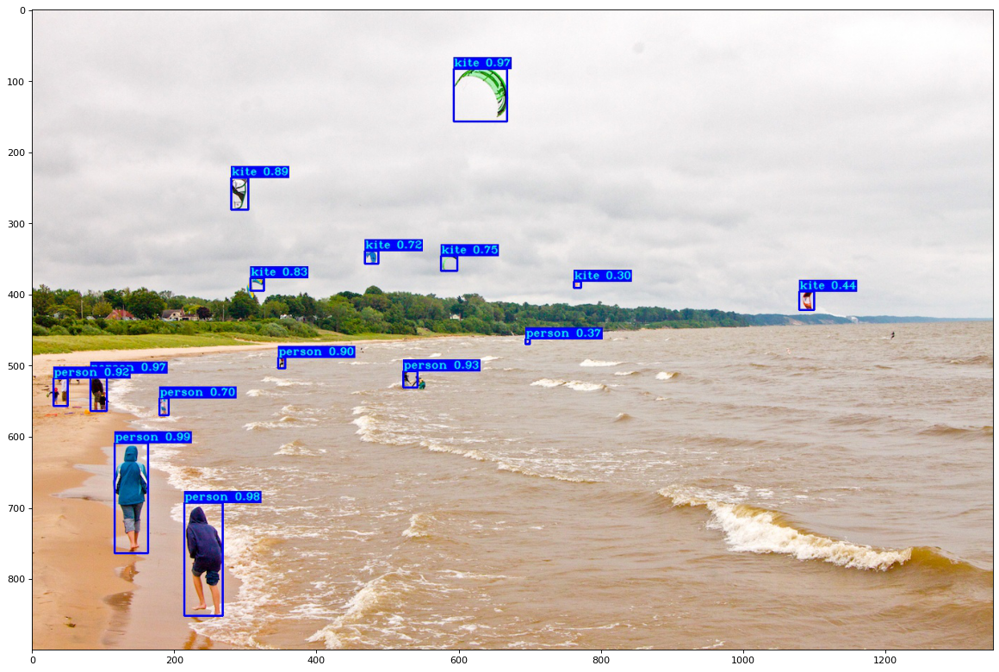

In [5]:
# solution
import cv2
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure

figure(figsize=(18, 16), dpi=80)

image=plt.imread(output_path)

plt.imshow(image)
print(image)




*   Load the configurations

In [6]:
# open the configs.py file to understand the different configuration parameters

from yolov3.configs import *

*   Load the pre-trained weights using the Load_Yolo_model fuction available in yolov3.utils

In [7]:
from yolov3.utils import Load_Yolo_model

yolo = Load_Yolo_model()

GPUs [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]
Loading Darknet_weights from: model_data/yolov3.weights


*   Preprocess the image according to the network to be used

In [8]:
import numpy as np
from yolov3.utils import image_preprocess

image_data = image_preprocess(np.copy(image), [YOLO_INPUT_SIZE, YOLO_INPUT_SIZE])
image_data = image_data[np.newaxis, ...].astype(np.float32)

print('Original image:', image.shape)
print('Processed image:', image_data.shape)

Original image: (900, 1352, 3)
Processed image: (1, 416, 416, 3)


### Prediction boxes

*   Predict bounding boxes using the predict method 

In [9]:
pred_bbox = yolo.predict(image_data)

*   Get the prediction statistics

In [10]:
print('Length of the prediction boxes =', len(pred_bbox))
print('Shape of each prediction box ')

for i in range(len(pred_bbox)):
    print('Shape of prediction box', i, 'is', pred_bbox[i].shape)

Length of the prediction boxes = 3
Shape of each prediction box 
Shape of prediction box 0 is (1, 52, 52, 3, 85)
Shape of prediction box 1 is (1, 26, 26, 3, 85)
Shape of prediction box 2 is (1, 13, 13, 3, 85)


*   Why is the length of prediction boxes 3?

**Solution**
Because 3 prediction boxes are required for making the prediction as each grid cell predict 2 bounding box.

The three prediction boxes represent the ideal location, shape and size of the object it specializes in predicting.

The variable pred_bbox returns a list of three NumPy arrays. These arrays predict both the bounding boxes and class labels but are encoded. They must be interpreted.



...

*   What does the shape of each prediction box represent?
*   Which layer corresponds to each prediction box output?

**Solution**


Each grid cell predicts a bounding box involving the x, y coordinate and the width and height and the confidence. A class prediction is also based on each cell. For example, an image may be divided into a 7×7 grid and each cell in the grid may predict 2 bounding boxes, resulting in 94 proposed bounding box predictions
...

*   What does 85 represent in the last dimension of the prediction box shape?

**Solution**
The 85 in the shape represents the confidence score.
At test time, the confidence score per bounding box is one of the outputs of the neural network. The output based on which boxes have the highest confidence.


They get a numerical output for each bounding box that’s treated as the confidence score. (2 such outputs are produced for the 2 bounding boxes per grid square that they used in their experiment.) 

this is calculated by a formula by multiplying the conditional probability that the grid square contains a particular class, given that it contains an object. That gives a confidence score for each class, for each bounding box.


*   What is the aim in having three prediction boxes array?
*   Why is it helpful?

**Solution**

...

*   Reshape the prediction boxes

In [11]:
import tensorflow as tf

pred_bbox = [tf.reshape(x, (-1, tf.shape(x)[-1])) for x in pred_bbox]
pred_bbox = tf.concat(pred_bbox, axis=0)


*   What do you think happens in the previous cell (reshaping the prediction boxes)? Explain the code as per your understanding.
*   Why do you think this step is needed?

**Solution**
In the previous step we are changing the dimensions for pred_bbox.

The reshaping of Pred_bbox is ncecessary to match the dimensions of the original image
...

*   What are anchor boxes? What is the significance of anchor boxes in YOLO?

**Solution**
 Anchor boxes are object detection algorithm that generates multiple bounding boxes with varying scales and aspect ratios centered on each pixel. These bounding boxes are called anchor boxes.
Object detection algorithms usually sample a large number of regions in the input image, determine whether these regions contain objects of interest, and adjust the boundaries of the regions so as to predict the ground-truth bounding boxes of the objects more accurately. Different models may adopt different region sampling schemes.

...

*   Post process the prediction bounding boxes

In [29]:
from yolov3.utils import postprocess_boxes

score_threshold = 0.3

bboxes = postprocess_boxes(pred_bbox, image, YOLO_INPUT_SIZE, score_threshold)

In [30]:
len(bboxes)

0

*   What is score threshold? What is the role of score threshold?

**Solution**

The postprocess_boxes function is used to determine the information of the prediction box, that is, the position of the prediction box, the confidence probability (the probability of judging that there is a detected object), and the category.

it is calculated by (class probability * confidence probability), if a certain detection box score is less than the score threshold, then it is discarded.

...

*   What happens when the score_threshold is low? What happens when it is high?

**Solution**

When the score threshold is low the length of bboxes increases and vice versa when its high

During detection if box score is less than the score threshold, then it is discarded.

...

### Non-maximum Supression

*   What is non-maximum supression? Why is it needed?
*   What happens in this step?

**Solution**

The nms function is used to remove redundant prediction boxes, which is the maximum suppression processing.

The set of detection frames with redundant detection frames removed.

The prediction box with an IOU value greater than the threshold is considered to be the same detection object as the prediction box with the highest score just taken out, so it is removed.



...

*   Apply NMS on the bounding boxes.

In [31]:
from yolov3.utils import nms

iou_threshold = 0.45

bboxes = nms(bboxes, iou_threshold, method='nms')

*   What is the role of IoU Threshold? What happens when a IoU higher threshold is used?

**Solution**

If the IOU value of a detection frame and the highest score detection frame in the same category is greater than this threshold, we consider this detection frame to be redundant and should be discarded.

The prediction box with an IOU value greater than the threshold is considered to be the same detection object as the prediction box with the highest score just taken out, so it is removed.

...

In [32]:
#  draw the predicted bounding boxes on the image

from yolov3.utils import draw_bbox

pred_image = draw_bbox(image, bboxes, CLASSES=YOLO_COCO_CLASSES, rectangle_colors='')

### Predicting output

*   Visualize the pred_image using matplotlib

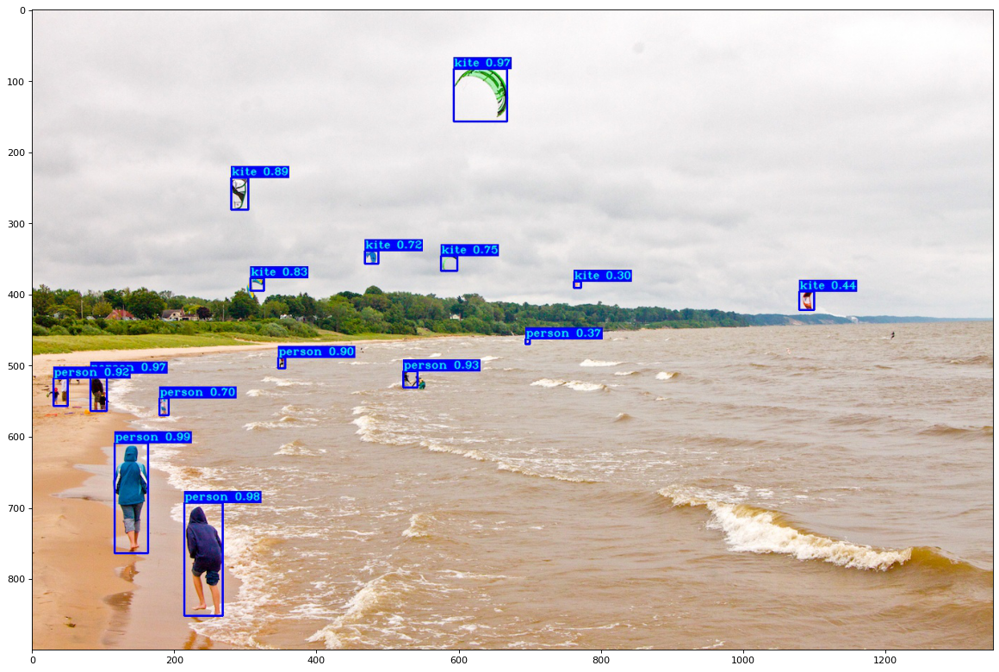

In [33]:
# solution

# solution
import cv2
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure

figure(figsize=(18, 16), dpi=80)


plt.imshow(pred_image)




# YOLO training

*   In this exercise, the task is to train mnist dataset using YOLOv3-Tiny model
*   Load the YOLOv3-Tiny weights using any one of the methods
*   For this experiment, we would use MNIST as the training data
*   Please note that all the necessary code is already available in the repo

In [34]:
# download the weights to the filesystem 
# (Remember that this would not be persistent)

! wget -P model_data https://pjreddie.com/media/files/yolov3-tiny.weights

--2021-12-20 21:17:16--  https://pjreddie.com/media/files/yolov3-tiny.weights
Resolving pjreddie.com (pjreddie.com)... 128.208.4.108
Connecting to pjreddie.com (pjreddie.com)|128.208.4.108|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 35434956 (34M) [application/octet-stream]
Saving to: ‘model_data/yolov3-tiny.weights’

yolov3-tiny.weights 100%[===================>]  33.79M  43.0MB/s    in 0.8s    

2021-12-20 21:17:18 (43.0 MB/s) - ‘model_data/yolov3-tiny.weights’ saved [35434956/35434956]



### Prepare data

*   The model takes a long time to train even with GPU. In order to fasten the training process, let us change the number of training and testing images in **mnist/make_data.py** file.
```
images_num_train = 500  # line number 20 in make_data.py
images_num_test = 50  # line number 21 in make_data.py
```
*   PS: 
    *   The dataset is already available in the repository.
    *   The file can be opened by double clicking on the filename from the Files menu.


*   Prepare the dataset for training

In [37]:
! python mnist/make_data.py

=> /content/TensorFlow-2.x-YOLOv3/mnist/mnist_train/000001.jpg 262,332,284,354,1 94,89,108,103,3 187,168,209,190,2 159,320,243,404,3 225,203,309,287,1 323,89,407,173,6
=> /content/TensorFlow-2.x-YOLOv3/mnist/mnist_train/000002.jpg 92,309,114,331,0 6,68,28,90,0 239,111,267,139,1 74,81,102,109,0 147,356,189,398,1 295,190,351,246,9 42,105,84,147,0 180,148,292,260,8 291,15,375,99,4
=> /content/TensorFlow-2.x-YOLOv3/mnist/mnist_train/000003.jpg 31,6,45,20,2 98,361,112,375,3 34,81,56,103,5 249,2,305,58,1
=> /content/TensorFlow-2.x-YOLOv3/mnist/mnist_train/000004.jpg 329,158,351,180,8 190,313,212,335,3 134,317,162,345,5 103,372,131,400,0 357,117,385,145,8 238,284,266,312,2 315,0,357,42,7 253,299,365,411,7 220,100,332,212,4 46,98,130,182,9
=> /content/TensorFlow-2.x-YOLOv3/mnist/mnist_train/000005.jpg 151,81,165,95,0 141,9,163,31,0 39,236,61,258,1 88,97,144,153,9 89,213,131,255,4 151,292,207,348,3 40,154,82,196,6 18,204,46,232,7 278,270,390,382,3 186,17,270,101,6 296,36,408,148,7
=> /content/T

### Tensorboard Visualization

*   Tensorboard is a visualization toolkit that allows for tracking and visualizing metrics such as loss and accuracy.
*   We would get introduced to tensorboard visualization here.
*   More information can be seen [here](https://www.tensorflow.org/tensorboard)

In [38]:
# Load the TensorBoard notebook extension

%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


### Train the network

*   Change the following train options in the **configs.py** file in the yolov3 folder
```
TRAIN_YOLO_TINY = True
# Replace the batch size with smaller number if the GPU size is not sufficient 
TRAIN_BATCH_SIZE = 128
# Replace the train epochs with smaller number for faster training
TRAIN_EPOCHS = 50
```



*   Train the model using MNIST dataset

In [39]:
! python train.py

2021-12-20 21:21:11.507894: W tensorflow/core/common_runtime/gpu/gpu_bfc_allocator.cc:39] Overriding allow_growth setting because the TF_FORCE_GPU_ALLOW_GROWTH environment variable is set. Original config value was 0.
[name: "/device:CPU:0"
device_type: "CPU"
memory_limit: 268435456
locality {
}
incarnation: 7806592262433961673
xla_global_id: -1
, name: "/device:GPU:0"
device_type: "GPU"
memory_limit: 2989686784
locality {
  bus_id: 1
  links {
  }
}
incarnation: 11892911869219012674
physical_device_desc: "device: 0, name: Tesla K80, pci bus id: 0000:00:04.0, compute capability: 3.7"
xla_global_id: 416903419
]
GPUs [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]
skipping conv2d_74
skipping conv2d_66
skipping conv2d_58
2021-12-20 21:21:36.168039: W tensorflow/core/common_runtime/bfc_allocator.cc:462] Allocator (GPU_0_bfc) ran out of memory trying to allocate 2.64GiB (rounded to 2835349504)requested by op Conv2D
If the cause is memory fragmentation maybe the environmen

*   If your tensorboard does not load, try to follow the following gif.

![](https://i.stack.imgur.com/ENl6b.gif)

In [40]:
# Visualize the training curves
# you can find the different loss curves by selecting custom scalars option
# in the top right drop down

%tensorboard --logdir /content/TensorFlow-2.x-YOLOv3/log/

<IPython.core.display.Javascript object>

*   Explain the loss used in YOLOv3

**Solution**

Instead of using mean square error in calculating the classification loss, YOLOv3 uses binary cross-entropy loss for each label. This also reduces the computation complexity by avoiding the softmax function.

Preferably 2 or 3 first layers taken from the original YOLO would be good. Before training, run a fine-tuning on some trained models to see the loss value. 

...

### Predicting objects

*   Change the following option in the **detect_mnist.py** 
```
ID = random.randint(0, 50)  # depending on the number of images in test set
```
*   Change the following train options in the **configs.py** 
```
TRAIN_MODEL_NAME = f"{YOLO_TYPE}_custom_Tiny"
```

*   Run the detction script to find the outut

In [41]:
! python detect_mnist.py

# You will find the predictions file saved in the output path

2021-12-20 21:27:05.916650: W tensorflow/core/common_runtime/gpu/gpu_bfc_allocator.cc:39] Overriding allow_growth setting because the TF_FORCE_GPU_ALLOW_GROWTH environment variable is set. Original config value was 0.
Traceback (most recent call last):
  File "detect_mnist.py", line 30, in <module>
    yolo.load_weights(f"./checkpoints/{TRAIN_MODEL_NAME}") # use keras weights
  File "/usr/local/lib/python3.7/dist-packages/keras/utils/traceback_utils.py", line 67, in error_handler
    raise e.with_traceback(filtered_tb) from None
  File "/usr/local/lib/python3.7/dist-packages/tensorflow/python/training/py_checkpoint_reader.py", line 35, in error_translator
    raise errors_impl.NotFoundError(None, None, error_message)
tensorflow.python.framework.errors_impl.NotFoundError: Unsuccessful TensorSliceReader constructor: Failed to find any matching files for ./checkpoints/yolov3_custom_Tiny


# Understanding Object Detection

*   What is the latest YOLO version available in literature? From the initial versions to the current version, what differences are made in each version?

**Solution**

The latest usable version is YOLOv5 which can also be run on mobiles.
v3 vs v2: There are more bouding boxes
v3 vs v4: an improvement in the mean average precision(mAP) by as much as 10% and the number of frames per second by 12% and speed.
v4 vs v5: V5 when tested with larger batch size, it said to have a higher interference speed than most of the detectors. it is portable and faster

...

*   What are the other object detection frameworks available in the literature? 
*   How different are they compared with YOLO?

**Solution**

1. Histogram of Oriented Gradients (HOG)
2. Region-based Convolutional Neural Networks (R-CNN)
3. Faster R-CNN
4. Single Shot Detector (SSD)

They are much slower than YOLO but are more accurate in prediction

...

*    What is the underlying algorithm behind YOLO? Explain each stage briefly.

1)Residual blocks:
First, the image is divided into various grids. Each grid has a dimension of S x S. The following image shows how an input image is divided into grids.

2)Bounding box regression:
A bounding box is an outline that highlights an object in an image.

Every bounding box in the image consists of the following attributes:

Width (bw)
Height (bh)
Class (for example, person, car, traffic light, etc.)- This is represented by the letter c.
Bounding box center (bx,by)

3)Intersection Over Union (IOU):

Intersection over union (IOU) is a phenomenon in object detection that describes how boxes overlap. YOLO uses IOU to provide an output box that surrounds the objects perfectly.

Each grid cell is responsible for predicting the bounding boxes and their confidence scores. The IOU is equal to 1 if the predicted bounding box is the same as the real box. This mechanism eliminates bounding boxes that are not equal to the real box.

*   Explain the network architecture used in training YOLO

**Solution**
the network architecture is divided into two:

Feature Extractor and Feature Detector (Multi-scale Detector). The image is first given to the Feature extractor which extracts feature embeddings and then is passed on to the feature detector part of the network that spits out the processed image with bounding boxes around the detected classes.
Let’s get a little deep into these components.
Feature Extractor
The previous YOLO versions have used Darknet-19 (a custom neural network architecture written in C and CUDA) as a feature extractor which was of 19 layers as the name suggests. YOLO v2 added 11 more layers to Darknet-19 making it a total 30-layer architecture. Still, the algorithm faced a challenge while detecting small objects due to downsampling the input image and losing fine-grained features.
YOLO V3 came up with a better architecture where the feature extractor used was a hybrid of YOLO v2, Darknet-53 (a network trained on the ImageNet), and Residual networks(ResNet). The network uses 53 convolution layers (hence the name Darknet-53) where the network is built with consecutive 3x3 and 1x1 convolution layers followed by a skip connection (introduced by ResNet to help the activations propagate through deeper layers without gradient diminishing).
...

*   What are the drawbacks in object detection frameworks?

**Solution**
1)Viewpoint variation: One of the biggest difficulties of object detection is that an object viewed from different angles may look completely different.
2)Deformation:The subject of computer vision analysis is not only a solid object but also bodies that can be deformed and change their shapes, which provides additional complexity for object detection.
3)Occlusion:Sometimes objects can be obscured by other things, which makes it difficult to read the signs and identify these objects. For example, in the first below image, a cup is covered by the hand of the person holding this cup.
4)Speed:When it comes to video, detectors need to be trained to perform analysis in an ever-changing environment. It means that object detection algorithms must not only accurately classify important objects but also be incredibly fast during prediction to be able to identify objects that are in motion. 
...


---

# **End of P5_1: Object Detection with YOLO**
Deadline for P5_1 submission in CampusVirtual is: **Monday, the 20th of December, 2021**